In [25]:
from pathlib import Path
import re
import os
import time
import pickle
import shutil
import numpy as np
from numpy.linalg import norm
from tqdm import tqdm, tqdm_notebook


# Visualization
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import PIL
from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data
%matplotlib inline 

# Model Building
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA


In [6]:
#%% -- At work
# current_wd = Path.cwd()
# print(current_wd)
# items = list(current_wd.glob('*'))
# pattern = re.compile('^[dD]ownloads|^.+h5$|^chrome.+|^Image.+')
# pattern = re.compile('^[dD]ownloads|^.+h5$|^chrome.+')

#%% --- at home work
at_home_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
os.chdir(at_home_dir)
img_folders = list(at_home_dir.glob('*'))
img_folders

[WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/angry human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/disgust human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/happy human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/neutral human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/sad human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/scared human face'),
 WindowsPath('D:/personal_projects/Dimitrov_project/dataset/downloads/Similarity-Search-master/images/surprise human face')]

In [61]:
# Change file names of images

for emo in tqdm(img_folders):
    for idx, img in enumerate(emo.glob('*')):
        img.rename(img.with_name(str(idx) + img.suffix))

100%|██████████| 7/7 [00:02<00:00,  3.49it/s]


In [3]:
# Feature Extraction
model = MobileNetV2(weights='imagenet', include_top=False,
                 input_shape=(224, 224, 3))
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path, target_size=(
        input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

In [62]:
feature_list = []
corrupted_imgs = []
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            feature_list.append((img,extract_features(img, model)))
        except Exception as e:
            corrupted_imgs.append(img)

    

100%|██████████| 7/7 [03:05<00:00, 26.55s/it]


In [88]:
corrupted = []
input_shape = (224, 224, 3)
for emo in tqdm(img_folders):
    for img in emo.glob('*'):
        try:
            im = image.load_img(img, target_size=(
        input_shape[0], input_shape[1]))
        except:
            corrupted.append(img)

100%|██████████| 7/7 [00:59<00:00,  8.47s/it]


In [97]:
# Move corrupted images to a different folders
import shutil
for img in corrupted:
    try:
        emotion = Path(img.parent.name)
        dest = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\corrupted_imgs')
        dest = dest / emotion
        dest.mkdir(exist_ok=True)
        shutil.move(str(img), dest)
    except Exception as e:
        print(e)

In [64]:
features = []
imgs = []
for img, feature in tqdm(feature_list):
    features.append(feature)
    imgs.append(img)

100%|██████████| 2596/2596 [00:00<00:00, 867740.93it/s]


In [115]:
import math
batch_size = 64
root_dir = at_home_dir
datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        batch_size=batch_size,
                                        class_mode=None,
                                        shuffle=False)

num_images = len(generator.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

start_time = time.time()
feature_list = []
feature_list = model.predict_generator(generator, num_epochs)
end_time = time.time()

Found 2595 images belonging to 7 classes.


In [116]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(num_images, -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

Num images   =  2595
Shape of feature_list =  (2595, 62720)
Time taken in sec =  144.97611665725708


In [120]:
path = Path('./data')
path.mkdir(exist_ok=True)
pickle.dump(generator.classes, open('./data/class_ids.pickle',
                                    'wb'))
pickle.dump(generator.filenames, open('./data/filenames.pickle', 'wb'))
pickle.dump(
    feature_list,
    open('./data/features-' + 'mobilenetv2' + '.pickle', 'wb'))

In [2]:
filenames = pickle.load(open('data/filenames.pickle', 'rb'))
feature_list = pickle.load(open('./data/features-' + 'mobilenetv2' + '.pickle', 'rb'))
class_ids = pickle.load(open('./data/class_ids.pickle', 'rb')) 

In [9]:

neighbors = NearestNeighbors(n_neighbors=5, algorithm='brute',
metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors([feature_list[0]])

In [5]:
str(at_home_dir)

'D:\\personal_projects\\Dimitrov_project\\dataset\\downloads\\Similarity-Search-master\\images'

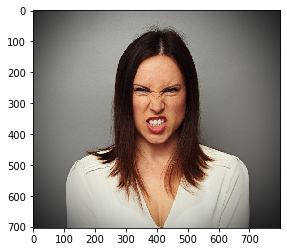

In [10]:
plt.imshow(mpimg.imread(filenames[0]))

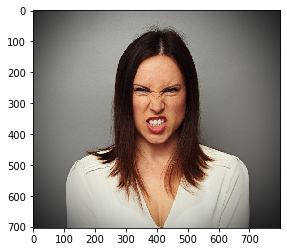

In [11]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]))

In [16]:
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(string):
    return string


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)

In [15]:
similar_image_paths

['angry human face\\10.jpg',
 'angry human face\\169.jpg',
 'angry human face\\171.jpg',
 'angry human face\\206.jpg']

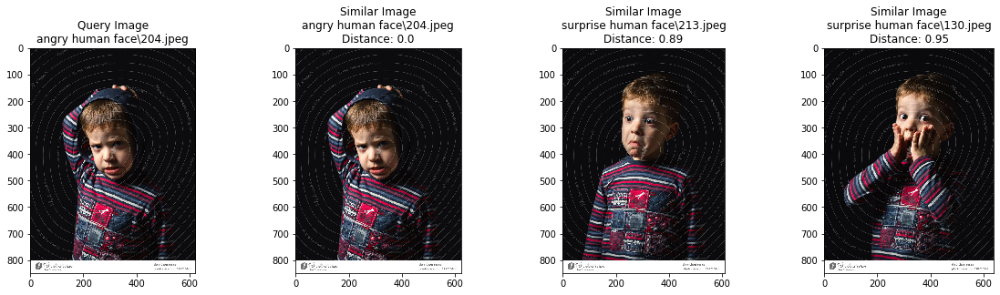

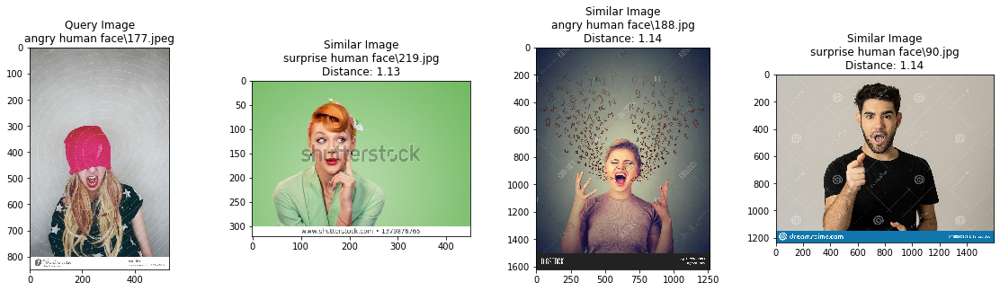

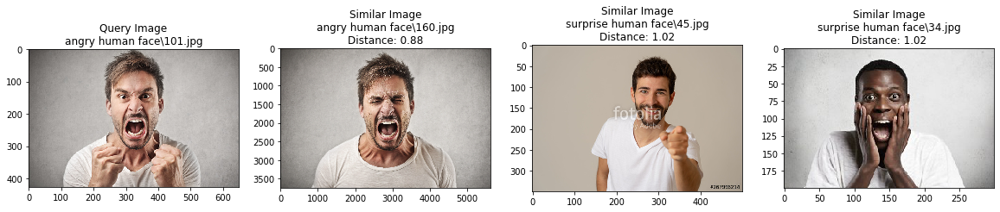

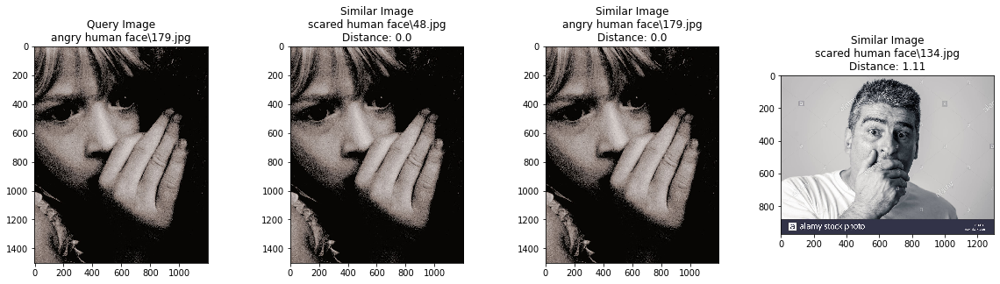

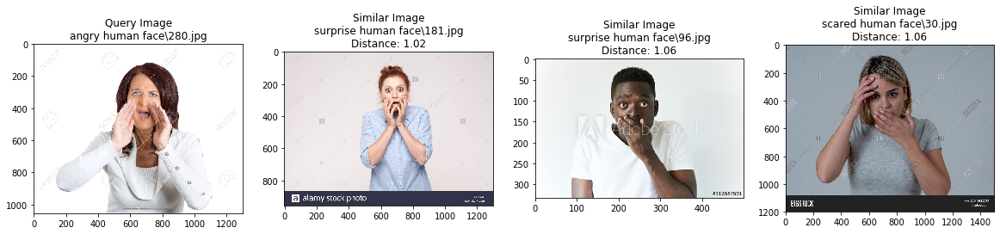

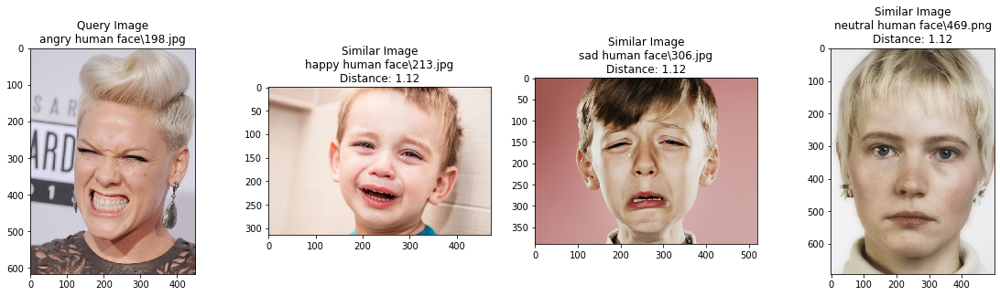

In [17]:
from numpy import random
num_images = 300
for i in range(6):
    random_image_index = random.randint(0,num_images)
    distances, indices = neighbors.kneighbors([feature_list[random_image_index]])
    # don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] +[filenames[indices[0][i]] for i in range(1,4)]
    plot_images(similar_image_paths, distances[0])

## Visualizing Clusters with t-SNE

In [111]:
len(class_ids)

2595

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2595 samples in 0.122s...
[t-SNE] Computed neighbors for 2595 samples in 2.656s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2595
[t-SNE] Computed conditional probabilities for sample 2000 / 2595
[t-SNE] Computed conditional probabilities for sample 2595 / 2595
[t-SNE] Mean sigma: 0.178244
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.671463
[t-SNE] KL divergence after 1000 iterations: 1.773042


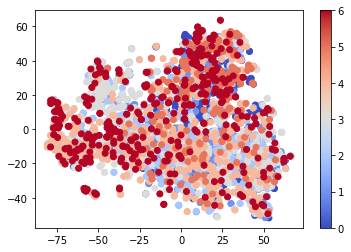

In [39]:

# Perform PCA over the features
num_feature_dimensions=100      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)
imgs = round(len(class_ids) / 2)
# For speed and clarity, we'll analyze about first half of the dataset.
# selected_features = feature_list_compressed[:imgs]
# selected_class_ids = class_ids[:imgs]
# selected_filenames = filenames

tsne_results = TSNE(n_components=2,verbose=1,metric='euclidean').fit_transform(feature_list_compressed)

# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1], c =
               class_ids, cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()

Invalid shape (100, 100, 2) for image data
Invalid shape (100, 100, 2) for image data
Invalid shape (100, 77, 2) for image data
Invalid shape (100, 77, 2) for image data
Invalid shape (100, 70, 2) for image data
Invalid shape (100, 77, 2) for image data
Invalid shape (100, 87, 2) for image data


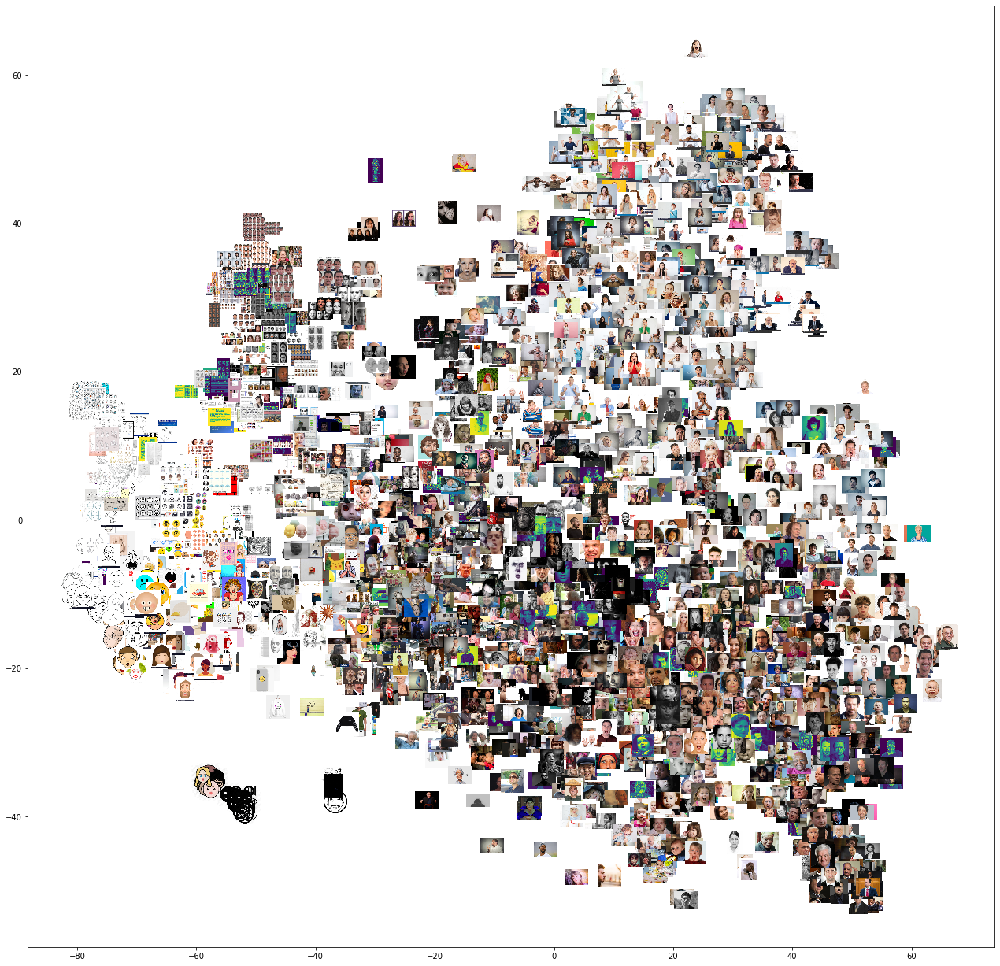

['angry human face\\116.png',
 'happy human face\\145.png',
 'neutral human face\\217.png',
 'neutral human face\\308.png',
 'neutral human face\\387.png',
 'neutral human face\\421.png',
 'sad human face\\147.png']

In [40]:


img_dir = Path(r'D:\personal_projects\Dimitrov_project\dataset\downloads\Similarity-Search-master\images')
def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    error = []
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        try:
            image = Image.open(img_dir / Path(image_path))
            image.thumbnail((100, 100), Image.ANTIALIAS)
            img = OffsetImage(image, zoom=zoom)
            anno_box = AnnotationBbox(img, (x0, y0),
                                    xycoords='data',
                                    frameon=False)
            axis.add_artist(anno_box)
        except Exception as e:
            # print(e)
            error.append(image_path)
        
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()
    return error

def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    error = plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)

        
    plt.show()
    return error
error = show_tsne(tsne_results[:, 0], tsne_results[:, 1], filenames)
error

---

In [27]:
dest = Path(r"E:\similarity_search")
for folder in img_folders:
    shutil.copytree(folder, dest / folder.name)
